# AGHRI 3D Late Camera–LiDAR Fusion and Tracking Benchmark

This notebook summarises the selected AGHRI camera-LiDAR fusion and tracking figures and tables. The figures shown here are the selected saved figures from `results/late_fusion_paper_assets/selected_notebook_assets`.

## Methods Compared

The late-fusion framework evaluates eight detector combinations. The camera detector is either generic (G) YOLO11s or AGHRI fine-tuned (FT) YOLO11s. The LiDAR detector is either SECOND or PointPillars, each in generic (G) or AGHRI fine-tuned form (FT).

In each combination, YOLO produces 2D person detections from the ZED RGB image, while SECOND or PointPillars produces 3D person detections from the Livox point cloud. The late-fusion stage projects each 3D LiDAR box into the camera image, matches it with YOLO using 2D IoU, and forwards matched/unmatched detections into the DeepFusionMOT-style tracker.

## Metrics Used

Tracking metrics are calculated with TrackEval, an evaluation toolkit for multi-object tracking. TrackEval compares the tracker predictions with ground truth and calculates tracking quality, detection quality, association quality, localisation precision, and identity metrics.

Abbreviations used in the equations: `GT` is the number of ground-truth objects; `TP`, `FP`, and `FN` are true positives, false positives, and false negatives; `IDTP`, `IDFP`, and `IDFN` are identity true positives, identity false positives, and identity false negatives.

| Metric | What does it mean? | Equation |
|---|---|---|
| HOTA (Higher Order Tracking Accuracy) (↑) | Overall tracking quality. Balances correct person detection and correct identity association. | `HOTA ≈ sqrt(DetA × AssA)` |
| DetA (Detection Accuracy) (↑) | Detection accuracy within tracking. Measures whether people were correctly detected, without too many missed or false boxes. | `DetA = TP / (TP + FP + FN)` |
| AssA (Association Accuracy) (↑) | Association accuracy. Measures whether each person keeps the correct tracking ID across frames. | Calculated from the proportion of correctly associated detections over time. |
| IDSW (Identity Switches) (↓) | Number of identity switches. When the same person changes from one predicted track ID to another. | Example: Person A is Track 2 and later becomes Track 6 → ID switch. |
| MOTP (Multi-Object Tracking Precision) (↑) | Localisation precision of matched tracked boxes. Measures how well predicted boxes overlap the matched GT boxes. | `MOTP = sum of matched IoU values / number of matches` |
| MOTA (Multi-Object Tracking Accuracy) (↑) | Overall tracking accuracy based on missed detections, false detections, and identity switches. Negative value means the total tracking errors exceeded the number of GT objects. | `MOTA = 1 - (FN + FP + IDSW) / GT` |
| IDF1 (Identity F1 score) (↑) | Identity-tracking accuracy. Measures how well the predicted identities match the ground-truth identities across the sequence. | `IDF1 = 2 × IDTP / (2 × IDTP + IDFP + IDFN)` |
| FPS (↑) | ROS 2 live playback throughput. Higher means the online system produced tracked outputs faster during playback. | `FPS = tracked output frames / measured playback time` |

## Test Data Used

The frozen held-out benchmark uses all six official AGHRI test recordings.

| Test recording | Scenario | Robot motion |
|---|---|---|
| `footpath1_p1_nj+mk+gl_1walk+check_mv_11_12_2024_1_label` | Footpath | Moving |
| `footpath1_p1_oj+mk+gl_1walk+check_st_11_12_2024_1_label` | Footpath | Stationary |
| `in_straw_3pick_diff_st_10_24_2024_5_a_label` | Polytunnel | Stationary |
| `out_straw_1push_1walk_1swap_st_11_07_2024_1_b_label` | Polytunnel/outdoor straw | Stationary |
| `out_vine_1push_3carry_st_ly_11_06_2024_1_label` | Vineyard | Stationary |
| `out_vine_4swap+walk_st_ly_11_06_2024_2_label` | Vineyard | Stationary |

The main results table and Figure 4 use all six recordings. Figure 5 is a compact scenario-level view using one selected representative bag per scenario, listed under that figure.

## Main Results Table

| ID | Combination | HOTA | DetA | AssA | IDSW | MOTP | MOTA | IDF1 | FPS |
|---|---|---|---|---|---|---|---|---|---|
| S1 | G YOLO + G SECOND | 0.1524 | 0.2129 | 0.1107 | 40 | 0.6291 | 0.0065 | 0.1664 | 12.73 |
| S2 | FT YOLO + G SECOND | 0.1576 | 0.2244 | 0.1127 | 43 | 0.6278 | -0.0306 | 0.1706 | 12.27 |
| S3 | G YOLO + FT SECOND | 0.2317 | 0.3335 | 0.1631 | 53 | **0.6559** | 0.1473 | 0.2581 | 12.69 |
| S4 | FT YOLO + FT SECOND | 0.2425 | 0.3511 | 0.1697 | 59 | 0.6536 | **0.1571** | 0.2727 | 12.43 |
| P1 | G YOLO + G PointPillars | 0.1098 | 0.1515 | 0.0824 | 37 | 0.6207 | -0.1061 | 0.1271 | **13.57** |
| P2 | FT YOLO + G PointPillars | 0.1161 | 0.1533 | 0.0903 | 36 | 0.6195 | -0.1053 | 0.1285 | 13.38 |
| P3 | G YOLO + FT PointPillars | 0.3539 | 0.4102 | 0.3089 | **29** | 0.6527 | -0.0020 | **0.3538** | 12.15 |
| P4 | FT YOLO + FT PointPillars | **0.3553** | **0.4116** | **0.3102** | **29** | 0.6526 | -0.0053 | 0.3533 | 12.14 |

**Key observation.** The best overall tracking result by HOTA is obtained by **FT YOLO + FT PointPillars**, which also gives the highest DetA and AssA. **G YOLO + FT PointPillars** gives a very slightly higher IDF1, while both fine-tuned PointPillars combinations have the lowest IDSW. Fine-tuned PointPillars gives a clear improvement over generic PointPillars, and it also outperforms the SECOND combinations in HOTA and association consistency. The highest live ROS 2 FPS is obtained by **G YOLO + G PointPillars**, while the best accuracy combination remains **FT YOLO + FT PointPillars**.

## Figure 1: AGHRI Late-Fusion And Deep Association Architecture

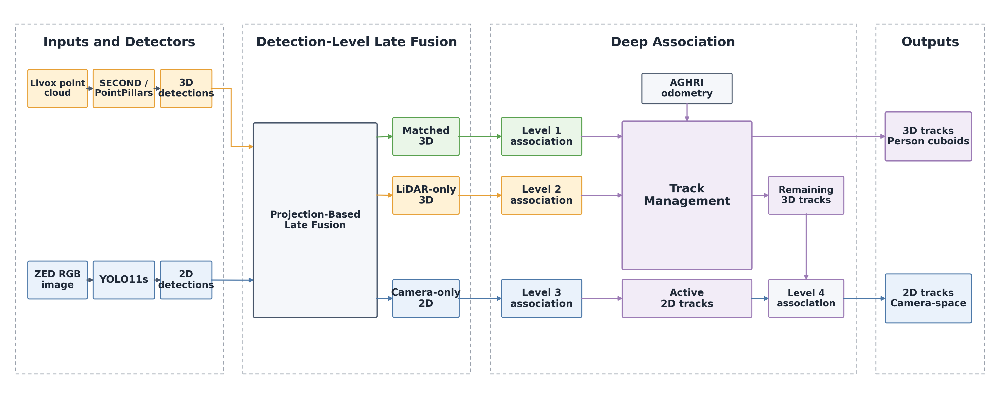

**Overview of the proposed AGHRI camera-LiDAR late-fusion and tracking framework.** YOLO produces camera-based 2D detections, while SECOND or PointPillars produces LiDAR-based 3D cuboids. After detector-output temporal synchronisation, projected LiDAR envelopes and camera boxes are associated using image-space IoU and Hungarian assignment. Matched 3D, LiDAR-only and camera-only detections are then processed through the four-level DeepFusionMOT association cascade, with Kalman prediction, AGHRI odometry compensation and lifecycle management producing persistent 3D and 2D tracks.

## Figure 2: Same-Frame Camera-LiDAR Association Example

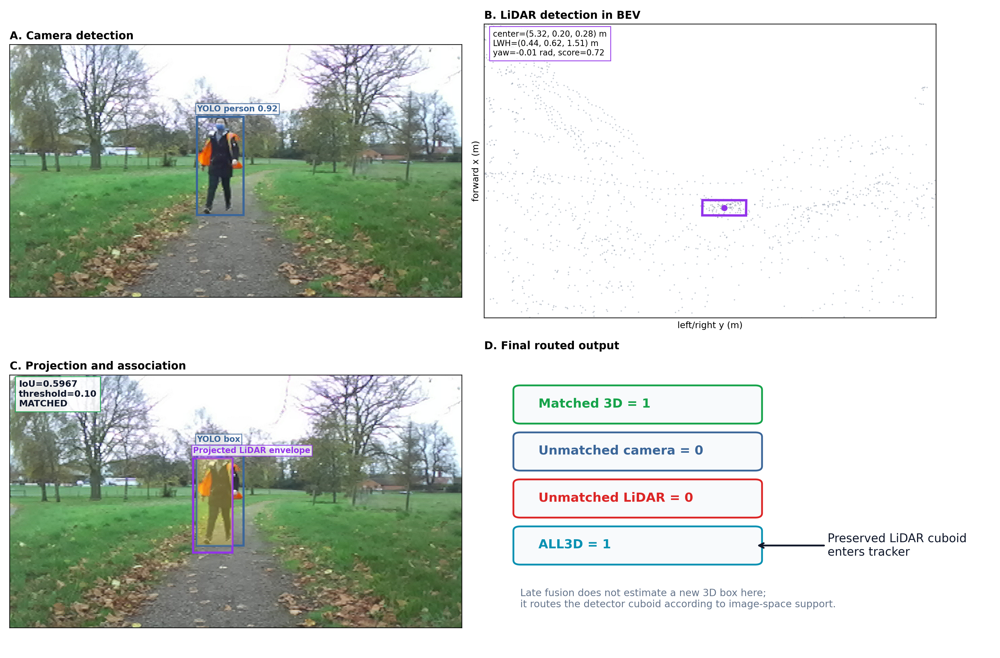

This figure follows one real AGHRI frame through the late-fusion decision. A YOLO 2D person box is compared with the projected LiDAR cuboid envelope; the image-space IoU is approximately `0.5967`, above the `0.10` fusion threshold, so the LiDAR cuboid is routed as a matched camera-supported 3D detection.

## Figure 3: Temporal Tracking And Persistent ID Continuity

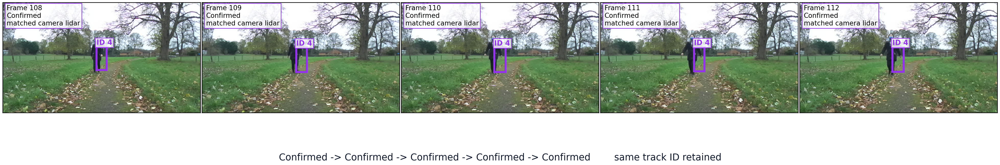

This qualitative example shows consecutive real frames from the moving footpath recording. The same person remains under the same confirmed DeepFusionMOT track ID across frames, illustrating what the tracking stage adds beyond independent frame-level detections.

## Figure 4: Effect Of Detector Adaptation On HOTA

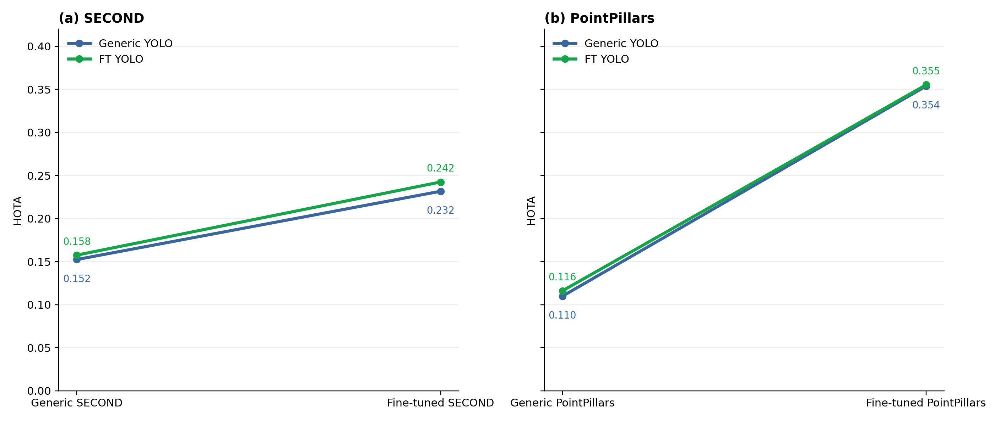

**Effect of camera and LiDAR detector fine-tuning on HOTA for (a) SECOND and (b) PointPillars.** Each panel compares generic and AGHRI fine-tuned YOLO11s with the corresponding generic and AGHRI fine-tuned LiDAR detector configurations. Fine-tuning the LiDAR detector produces the dominant HOTA improvement, while changing only the camera checkpoint gives a smaller change. The strongest HOTA is obtained by the fine-tuned PointPillars setting.

## Figure 5: Per-Recording Robustness Of The Two Fully Fine-Tuned Systems

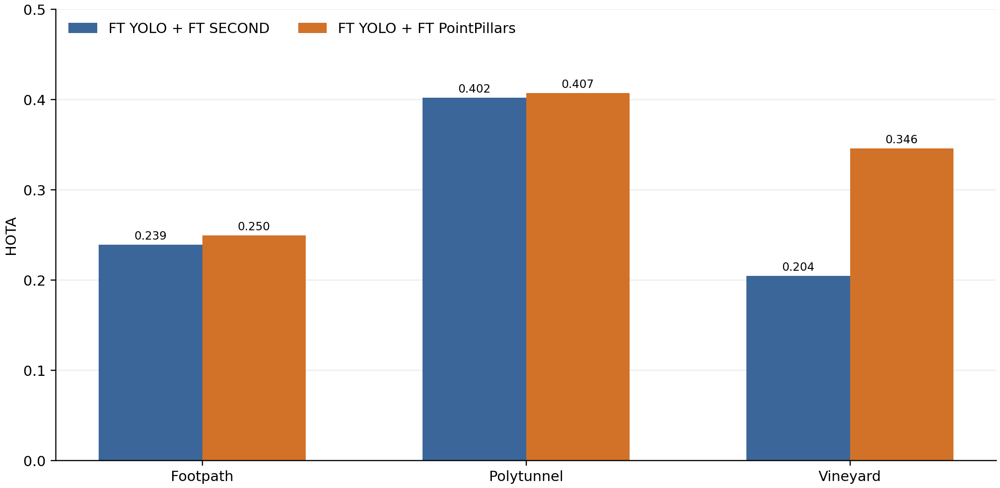

This figure is a compact scenario-level view. It uses one selected representative bag per scenario rather than all six test bags:

| Scenario | Selected bag used in this figure |
|---|---|
| Footpath | `footpath1_p1_oj+mk+gl_1walk+check_st_11_12_2024_1_label` |
| Polytunnel | `in_straw_3pick_diff_st_10_24_2024_5_a_label` |
| Vineyard | `out_vine_4swap+walk_st_ly_11_06_2024_2_label` |

It compares the two fully fine-tuned final systems: **FT YOLO + FT SECOND** and **FT YOLO + FT PointPillars**.

## Figure 6: ROS 2 Playback DeepFusionMOT Projection Image

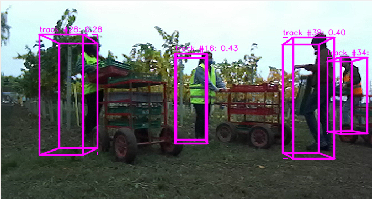

This figure shows the tracked DeepFusionMOT projection image from RViz during live ROS 2 bag playback. The live detector nodes run fine-tuned YOLO11s and fine-tuned PointPillars on the incoming image and Livox point cloud. The tracker output is then projected back onto the camera image, so the magenta cuboids and labels show the final persistent DeepFusionMOT tracks in image space.


## Figure 7: ROS 2 Playback DeepFusionMOT Tracks On Point Cloud

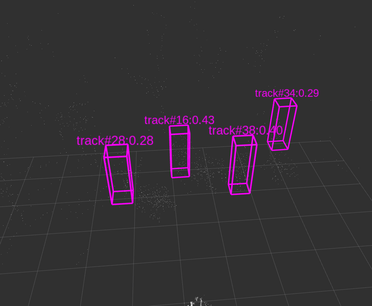

This is the corresponding RViz point-cloud view from the same ROS 2 playback workflow. Only the tracked DeepFusionMOT markers are shown here, so the figure focuses on the final persistent 3D track output rather than the intermediate original LiDAR, matched, or unmatched detector markers.

## Summary

Across the frozen six-recording AGHRI benchmark, the strongest final tracking result is obtained by **FT YOLO + FT PointPillars**. The main quantitative gain comes from LiDAR detector adaptation: fine-tuned PointPillars gives the best HOTA, DetA and AssA, while the fine-tuned SECOND setting also improves clearly over generic SECOND. The ROS 2 playback figures show the same framework running online with live detector nodes, late-fusion association, DeepFusionMOT tracking, and RViz visualisation. Together, the quantitative tables and qualitative playback examples show that the completed framework supports both offline TrackEval-style benchmarking and live camera-LiDAR tracking visualisation on AGHRI rosbag data.